# 1st Level visualization

To be run on local computer (Macbook Pro)

Aims of this script:
- Visualize contrasts from 1st level analysis of RED Emotional Go/No-Go task
- Test out AtlasReader from Michael Notter et al: https://github.com/miykael/atlasreader
    - Generates coordinate tables and region labels from MRI images

In [1]:
# Install AtlasReader if you haven't already
#!pip3 install atlasreader

     |████████████████████████████████| 12.0 MB 2.3 MB/s eta 0:00:01
     |████████████████████████████████| 8.5 MB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 61 kB 748 kB/s eta 0:00:01
     |████████████████████████████████| 3.0 MB 1.8 MB/s eta 0:00:01
     |████████████████████████████████| 302 kB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 2.2 MB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 12.9 MB 3.5 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 4.3 MB 2.8 MB/s eta 0:00:01
     |████████████████████████████████| 7.3 MB 3.4 MB/s eta 0:00:01
     |████████████████████████████████| 157 kB 3.9 MB/s eta 0:00:01
  Created wheel for atlasreader: filename=atlasreader-0.1.2-py3-none-any.whl size=12046471 sha256=3745edb3e3f38567c69f0ec3d30b0409a02a19545041bb71b9dd9725b78aa373
  Stored in directory: /Users/stepheniuh/Library/Caches/pip/wheels/87/0b/8b/83185241c4f1

In [2]:
# # Check path
# import sys

# # can see where everything is
# print(sys.path)
# print(sys.version)

# # To show the current set path
# print(sys.executable)

['/Users/stepheniuh/ownCloud/PhD/RED/RED-scripts', '/usr/local/Cellar/python@3.9/3.9.1_6/Frameworks/Python.framework/Versions/3.9/lib/python39.zip', '/usr/local/Cellar/python@3.9/3.9.1_6/Frameworks/Python.framework/Versions/3.9/lib/python3.9', '/usr/local/Cellar/python@3.9/3.9.1_6/Frameworks/Python.framework/Versions/3.9/lib/python3.9/lib-dynload', '', '/usr/local/Cellar/jupyterlab/3.0.3/libexec/lib/python3.9/site-packages', '/usr/local/Cellar/jupyterlab/3.0.3/libexec/lib/python3.9/site-packages/IPython/extensions', '/Users/stepheniuh/.ipython']
3.9.1 (default, Jan  8 2021, 17:17:43) 
[Clang 12.0.0 (clang-1200.0.32.28)]
/usr/local/Cellar/jupyterlab/3.0.3/libexec/bin/python


In [6]:
# # change path to use downloaded packages
# sys.path.append('/usr/local/lib/python3.9/site-packages')

# Contrast list

- cont01 = NoGo > Go
- cont02 = Face > Control
- cont03 = Sad > Neutral
- cont04 = Happy > Neutral
- cont05 = Sad > Happy
- cont06 = Happy > Sad
- cont07 = Sad > Control
- cont08 = Sad NoGo > Sad Go

In [1]:
# Import packages
%matplotlib inline
from nilearn import plotting
from nilearn.plotting import plot_glass_brain
from IPython.display import Image
from nilearn.image import threshold_img

## Visualize results

Let's look at the contrasts of one subject that we've just computed. First, let's see what the difference of smoothing is for the contrast **`average`**

<i>This is the same as what is at the end of the 1st level script</i>

In [2]:
# to check cwd
import os
os.getcwd()

'/Users/stepheniuh/ownCloud/PhD/RED/RED-scripts'

In [3]:
# Set working directories

# Where T1 images are on local computer
img_dir = '/Users/stepheniuh/downloads/derivatives'
# Where 1st level output files are and where we want to save images and tables
output_dir = '/Users/stepheniuh/ownCloud/PhD/RED/1stlevel_output/1stLevel'

In [197]:
# Look at one subject at a time
#from nilearn import plotting
sub = '077'
anatimg = img_dir + '/sub-%s/anat/sub-%s_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz' % (sub,sub)

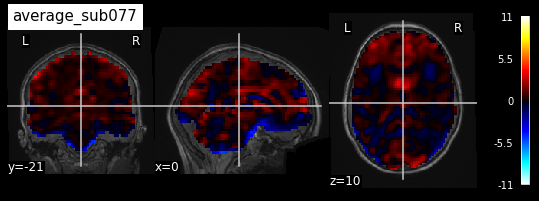

In [198]:
plotting.plot_stat_map(
    output_dir + '/sub-%s/con_0001.nii'%(sub), title='average_sub%s'%sub,
    bg_img=anatimg, display_mode='ortho');

Can adjust threshold

### Interactive image


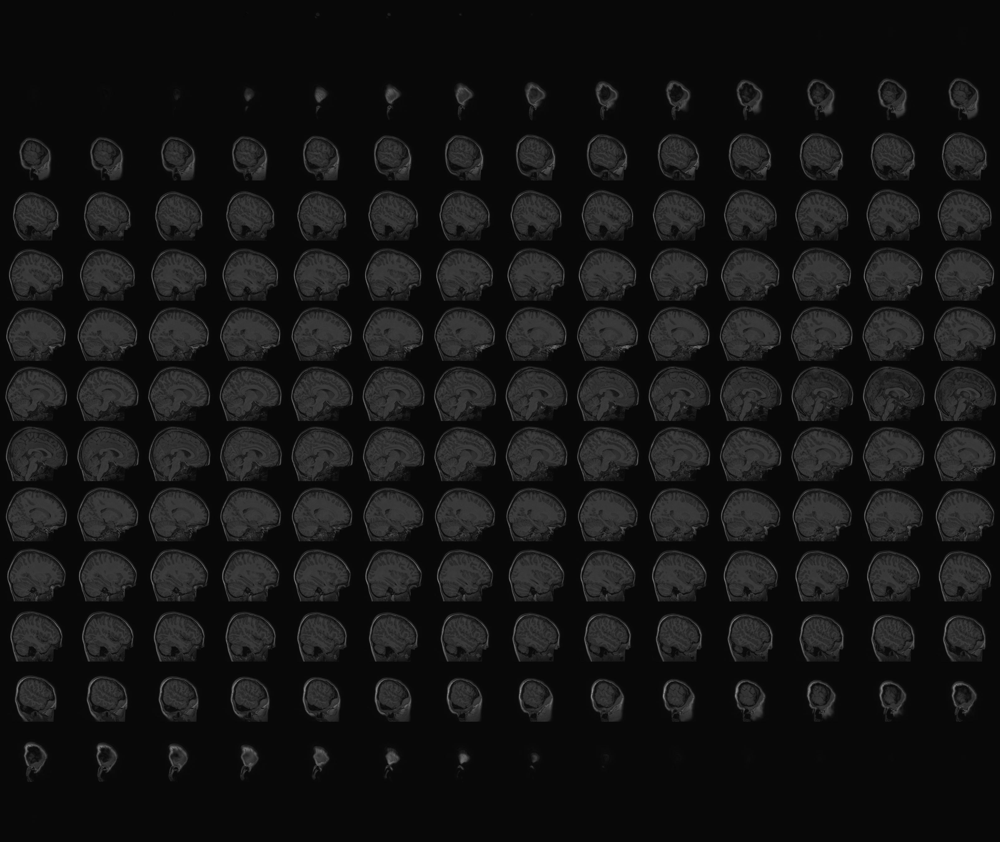
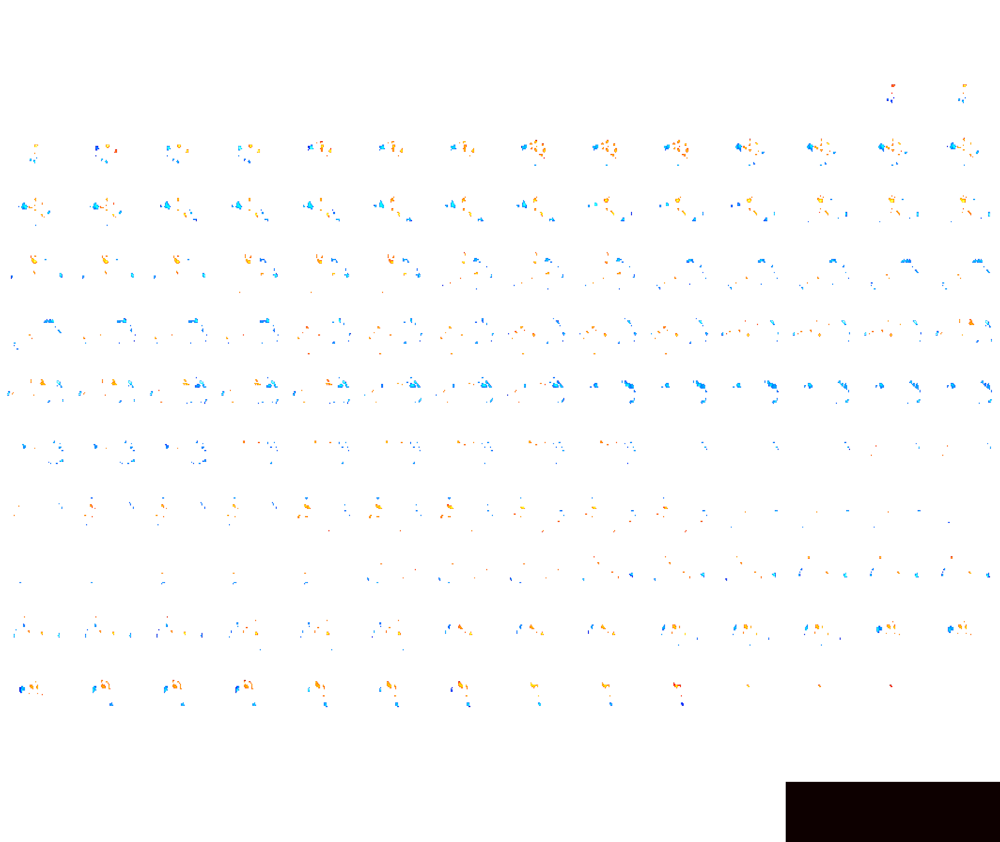

In [17]:
view = plotting.view_img(output_dir + '/sub-%s/spmT_0001.nii'%(sub), bg_img = anatimg,
                         title='Tmap_NoGovsGo_sub%s'%sub, threshold=3)
view

## Look at contrasts

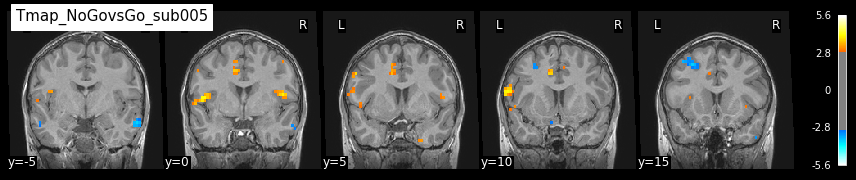

In [18]:
plotting.plot_stat_map(output_dir + '/sub-%s/spmT_0001.nii'%(sub), 
              bg_img = anatimg, title='Tmap_NoGovsGo_sub%s'%sub, 
              threshold=3, display_mode='y', cut_coords=(-5, 0, 5, 10, 15), 
              dim=-1)

### Interactive image


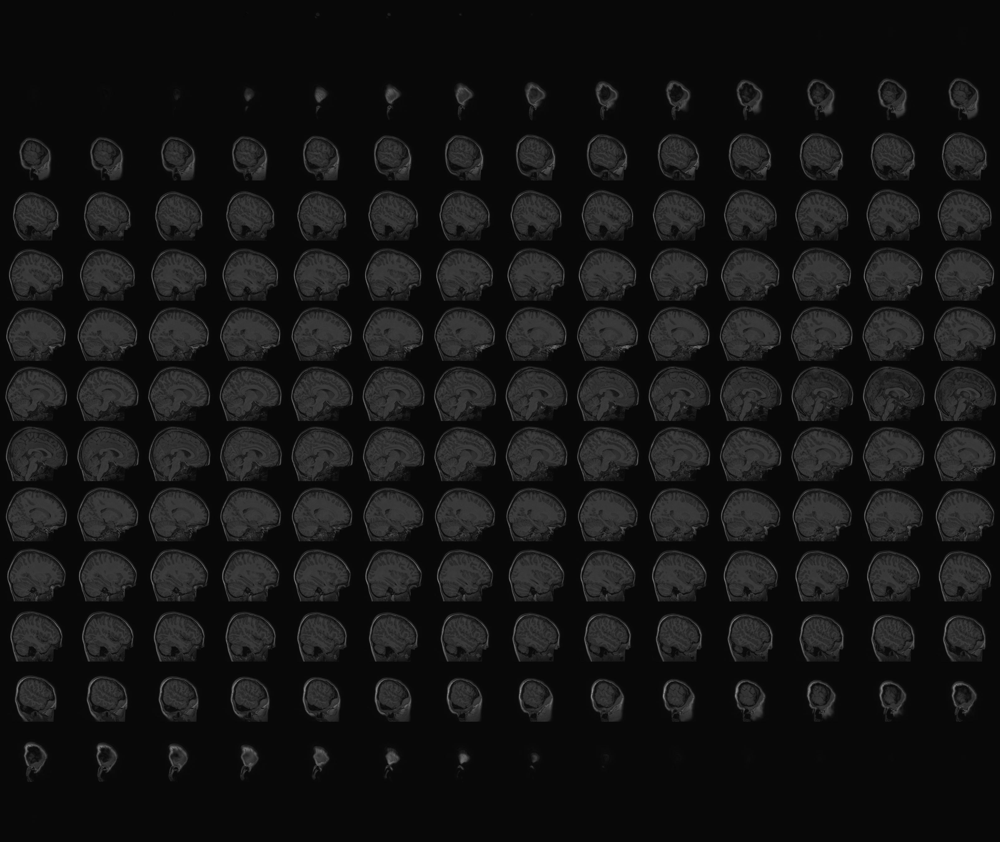
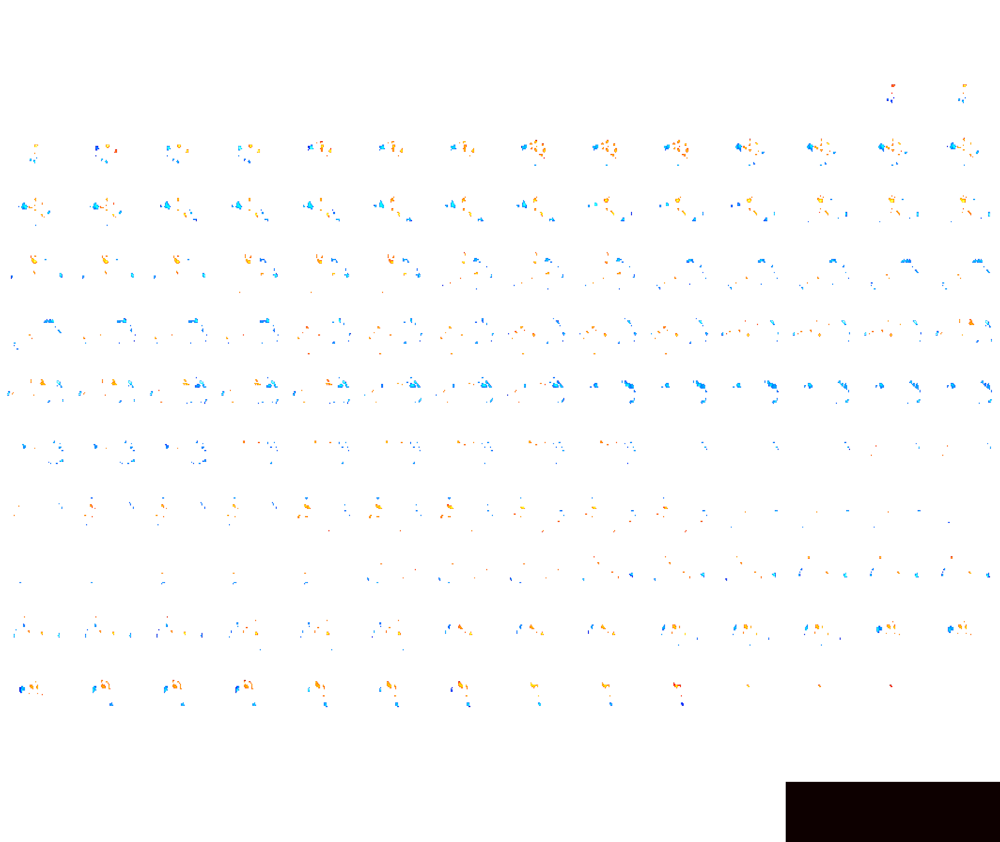

In [19]:
view = plotting.view_img(output_dir + '/sub-%s/spmT_0001.nii'%(sub), bg_img = anatimg,
                         title='Tmap_NoGovsGo_sub%s'%sub, display_mode = 'y', cut_coords=(-14,-67,51),threshold=3)
view

### Glass brain

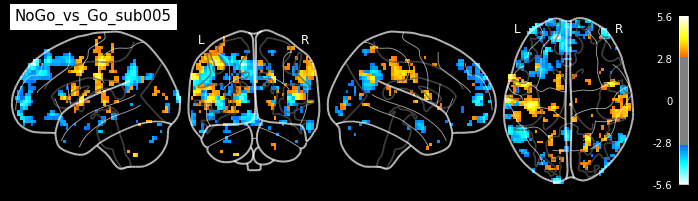

In [25]:
plot_glass_brain(output_dir + '/sub-%s/spmT_0001.nii'%(sub), black_bg=True, colorbar=True, plot_abs=False,
                 threshold = 3, display_mode='lyrz', title='NoGo_vs_Go_sub%s'%sub);

# AtlasReader

### Pulling in AtlasReader to understand where peaks of clusters are, over which regions the clusters extend, and how big they are
* Citation and references to this package are on the github (link at top)

In [26]:
from atlasreader import create_output

The Python package you are importing, AtlasReader, is licensed under the
BSD-3 license; however, the atlases it uses are separately licensed under more
restrictive frameworks.
By using AtlasReader, you agree to abide by the license terms of the
individual atlases. Information on these terms can be found online at:
https://github.com/miykael/atlasreader/tree/master/atlasreader/data



In [42]:
# Save stat map as thresholded file (will need to do this for each contrast)

# Threshold image at value of 3 to create clusters (can adjust this)
nogovsgo_stat_img = output_dir + '/sub-%s/spmT_0001.nii'%(sub)
stat_img = threshold_img(nogovsgo_stat_img, threshold=3)

# Save thresholded image into a NIfTI file into 1st level output sub folder
file_name = output_dir + '/sub-%s/nogovsgo_stat_img.nii.gz'%(sub)
stat_img.to_filename(file_name)

TypeError: threshold_img() got an unexpected keyword argument 'bg_img'

### Running AtlasReader

Need to provide stat map (file_name or the image object) and cluster extent (specifies minimum number of contiguous voxels required for a cluster to be considered for the analysis, i.e., 5)

In [29]:
create_output(file_name, cluster_extent = 5, direction = 'both')

Output = 4 different kind of files:

1. <b> Overview figure</b>: shows results within the whole brain at once
2. <b> Informative figure for each cluster </b>: shows sagittal, coronal, and transversal plane centered at center of the cluster
3. <b> Peak csv file</b>: contains relevant info about peak of each cluster
4. <b> Cluster csv file</b>: contains relevant info about each cluster

#### 1. Overview figure

Shows all clusters throughout the brain, plotted on a glass brain plot.

The name of the file is the name of the provided statistical image (saved above) but with the file ending `.png`

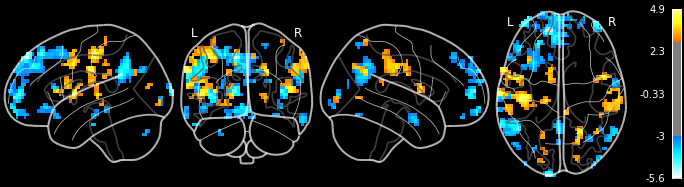

In [31]:
Image(output_dir + '/sub-%s/nogovsgo_stat_img.png'%(sub))

#### 2. Informative cluster figure

Shows the cluster center in 3 anatomical planes. The name of these files all end in `_cluster##.png`

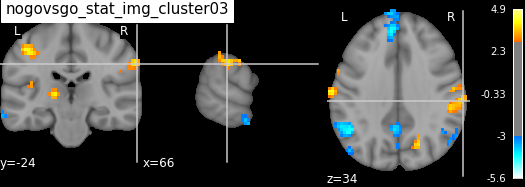

In [37]:
Image(output_dir + '/sub-%s/nogovsgo_stat_img_cluster03.png'%(sub))

#### 3. Peak table

CSV file ending with `_peaks.csv` contains location of each cluster's peak, its signal value at this location, the cluster extent (in mm, NOT in number of voxels), and the atlas correspondence of the peak:

In [38]:
import pandas as pd
pd.read_csv(output_dir + '/sub-%s/nogovsgo_stat_img_peaks.csv'%(sub))

,cluster_id,peak_x,peak_y,peak_z,peak_value,volume_mm,aal,desikan_killiany,harvard_oxford
0,1,-12,54,45.75,-5.61276,6007.50,no_label,Unknown,7.0% Left_Frontal_Pole
1,2,-66,-51,27.00,-4.45198,5535.00,no_label,Unknown,9.0% Left_Angular_Gyrus; 9.0% Left_Supramargin...
2,3,66,-24,34.50,4.03894,3847.50,SupraMarginal_R,ctx-rh-supramarginal,63.0% Right_Supramarginal_Gyrus_anterior_divis...
3,4,-24,39,49.50,-4.66698,3476.25,Frontal_Sup_2_L,Unknown,15.0% Left_Frontal_Pole; 13.0% Left_Superior_F...
4,5,-42,-21,49.50,4.94438,3408.75,Postcentral_L,Left-Cerebral-White-Matter,45.0% Left_Postcentral_Gyrus; 19.0% Left_Prece...
5,6,57,-63,23.25,-3.92108,2227.50,Occipital_Mid_R,ctx-rh-inferiorparietal,70.0% Right_Lateral_Occipital_Cortex_superior_...
6,7,-66,-15,30.75,4.86286,1890.00,Postcentral_L,Unknown,42.0% Left_Postcentral_Gyrus
7,8,0,-57,38.25,-4.12554,1653.75,Precuneus_L,Unknown,44.0% Left_Precuneous_Cortex; 16.0% Right_Prec...
8,9,0,66,-14.25,-4.32134,1518.75,Frontal_Med_Orb_L,Unknown,19.0% Right_Frontal_Pole; 17.0% Left_Frontal_Pole
9,10,-48,3,4.50,4.61668,1350.00,Insula_L,ctx-lh-precentral,61.0% Left_Central_Opercular_Cortex


#### 4. Cluster table

CSV file ending with `_cluster.csv` contains location of each cluster's peak, the mean value within the cluster, the cluster extent (in mm, NOT in number of voxels), and membership of each cluster given a particular atlas

In [39]:
pd.read_csv(output_dir + '/sub-%s/nogovsgo_stat_img_clusters.csv'%(sub))

,cluster_id,peak_x,peak_y,peak_z,cluster_mean,volume_mm,aal,desikan_killiany,harvard_oxford
0,1,-12,54,45.75,-3.52177,6007.50,62.36% Frontal_Sup_Medial_L; 25.84% no_label; ...,52.25% Unknown; 31.46% ctx-lh-superiorfrontal;...,38.20% Left_Frontal_Pole; 35.96% Left_Superior...
1,2,-66,-51,27.00,-3.60174,5535.00,34.76% SupraMarginal_L; 28.66% Angular_L; 18.9...,39.02% Left-Cerebral-White-Matter; 24.39% ctx-...,57.93% Left_Angular_Gyrus; 32.32% Left_Suprama...
2,3,66,-24,34.50,3.37451,3847.50,63.16% SupraMarginal_R; 20.18% Postcentral_R; ...,33.33% ctx-rh-supramarginal; 31.58% Unknown; 2...,55.26% Right_Supramarginal_Gyrus_anterior_divi...
3,4,-24,39,49.50,-3.37366,3476.25,63.11% Frontal_Mid_2_L; 23.30% Frontal_Sup_2_L...,38.83% Unknown; 26.21% ctx-lh-caudalmiddlefron...,61.17% Left_Middle_Frontal_Gyrus; 21.36% Left_...
4,5,-42,-21,49.50,3.55450,3408.75,79.21% Postcentral_L; 8.91% no_label; 7.92% Pr...,45.54% Left-Cerebral-White-Matter; 24.75% Unkn...,80.20% Left_Postcentral_Gyrus; 19.80% Left_Pre...
5,6,57,-63,23.25,-3.37268,2227.50,65.15% Angular_R; 13.64% no_label; 12.12% Temp...,53.03% ctx-rh-inferiorparietal; 37.88% Unknown,75.76% Right_Lateral_Occipital_Cortex_superior...
6,7,-66,-15,30.75,3.43839,1890.00,67.86% Postcentral_L; 26.79% no_label,35.71% Unknown; 30.36% ctx-lh-postcentral; 19....,58.93% Left_Postcentral_Gyrus; 30.36% Left_Cen...
7,8,0,-57,38.25,-3.34131,1653.75,63.27% Precuneus_L; 16.33% Cingulate_Post_L; 1...,63.27% Unknown; 30.61% ctx-lh-precuneus; 6.12%...,53.06% Left_Precuneous_Cortex; 26.53% Left_Cin...
8,9,0,66,-14.25,-3.51060,1518.75,42.22% no_label; 28.89% Frontal_Med_Orb_L; 20....,64.44% Unknown; 15.56% ctx-lh-medialorbitofron...,68.89% Left_Frontal_Pole; 26.67% Right_Frontal...
9,10,-48,3,4.50,3.51302,1350.00,65.00% Rolandic_Oper_L; 12.50% Temporal_Sup_L;...,40.00% Unknown; 37.50% ctx-lh-precentral; 17.5...,77.50% Left_Central_Opercular_Cortex; 12.50% L...
